# Document Processing with OCR
We will build an agent for document processing with optical character recognition (OCR).

**Learning Objectives:**
- Parsing and extracting information from documents
- Building an agent equipped with an OCR tool
- Identifying failure modes of OCR

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Install for gpu paddlepaddle-gpu
!pip install -qU langchain langchain-groq pytesseract "paddleocr[all]" paddlepaddle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.2/55.2 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.9/67.9 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.4/80.4 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.2/55.2 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

```bash
nano /usr/local/lib/python3.12/dist-packages/paddlex/inference/pipelines/components/retriever/base.py
```
```python
from langchain_core.documents import Document
from langchain_text_splitters import RecursiveCharacterTextSplitter
```

In [3]:
# import libraries
from langchain_core.messages import HumanMessage
from langchain.agents import create_agent
from langchain_groq import ChatGroq
from langchain.tools import tool

from IPython.display import display
from PIL import Image
import pytesseract
import re
import os


from google.colab import userdata
GROQ_API_KEY = userdata.get('GROQ_API')

In [4]:
# ocr tool
@tool
def ocr_read_document(image_path: str)->str:
  """Reads an image from the given path and returns extracted text using OCR."""
  try:
    text = pytesseract.image_to_string(
        Image.open(image_path)
        )
    return text
  except Exception as e:
    return f"Error reading image: {e}"

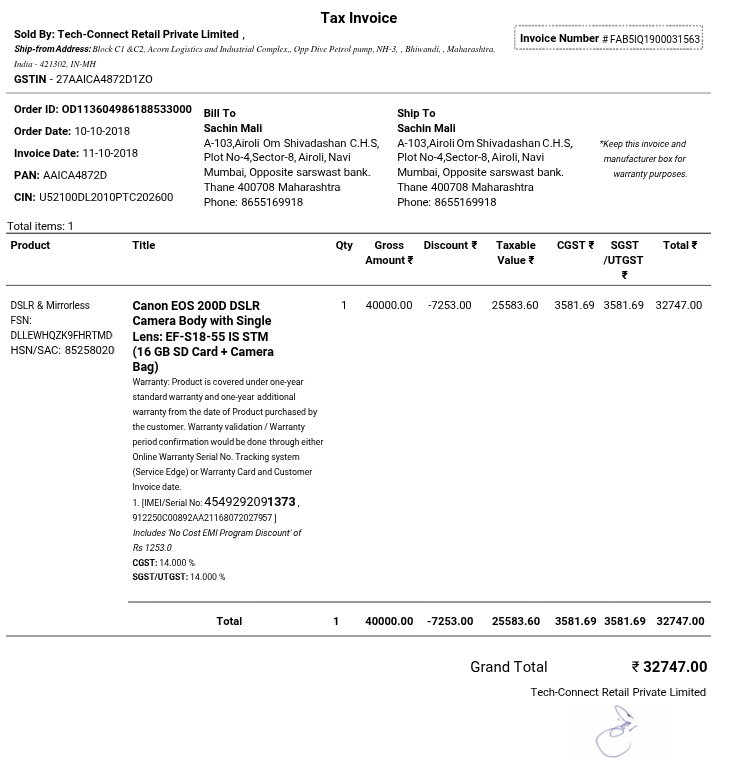

In [5]:
image_path = "/content/drive/MyDrive/ade/invoice.png"
img = Image.open(image_path)
display(img)

In [6]:
ocr_text = ocr_read_document.run("/content/drive/MyDrive/ade/invoice.png")
print("Raw OCR Output:\n----------------\n", ocr_text)

Raw OCR Output:
----------------
 Tax Invoice

‘Sold By: Tech-Connect Retail Private Limited ,

Invoice Number #FAB5IQ1900031563,

‘Shiptom Address lock 1 C2, cor Logis dtl Compl, Opp Die Pr pump. IE Bhiwani Maharastra

GSTIN -27AAICA48720120

Order ID: 00113604986188533000 guy To
‘Sachin Malt

4-103,Airoli Om Shivadashan CHS,
Plot No-4,Sector-8, Aol, Navi
Mumbai, Opposite sarswast bank.
‘Thane 400708 Maharashtra

Phone: 8655169918

Order Date: 10-10-2018
Involee Date: 11-10-2018

PAN: AAICAAS720

‘oN: Us2100012010°TC202600

Total items: 1

Ship To
‘Sachin Mall

‘A103 AiroliOm ShivadashanC.H.S, “keep thisiveee and
Plot No-4Sector-8, Airoli,Navi manufacturers for
‘Mumbai, Opposite sarswast bank. waranty purposes
‘Thane 400708 Maharashtra

Phone: 8655169918

 

 

Product Title aty

Gross
‘Amount ®

Discount ® Taxable

Value ®

ccsT® scsT
yorest

z

Total®

 

DSLR & Miorless
SN:

DLLEWHOZKSFHRTMD
HSN/SAC: 85258020

Canon EOS 2000 DSLR 1
Camera Body with Single

Lens: EF-S18-55 IS STM

(

In [7]:
# extract info using regex
# Regex to find Tax or Total
tax_match = re.search(r'Taxable\s*\$?([0-9.,]+)', ocr_text)
total_match = re.search(r'Total\s*\$?([0-9.,]+)', ocr_text)

# Print tax amount if found
if tax_match:
    print("Tax found by regex:", tax_match.group(1))
else:
    print("Tax not found by regex.")

# Print total amount if found
if total_match:
    print("Total found by regex:", total_match.group(1))
else:
    print("Total not found by regex.")

Tax not found by regex.
Total found by regex: 1


In [8]:
# create Agent
llm = ChatGroq(
    model="openai/gpt-oss-120b",
    groq_api_key=GROQ_API_KEY,
    temperature=1
)
tools =[ocr_read_document]

system_prompt = """
You are a helpful assistant designed to extract information from documents.
You have access to this tool:
OCR tool to extract raw text from images
"""

agent = create_agent(
    model=llm,
    tools=tools,
    system_prompt=system_prompt
)

task = """
Please process the document at '/content/drive/MyDrive/ade/invoice.png' using the OCR tool
and extract the following information in JSON format:
- tax
- total
"""

inputs = {"messages": [HumanMessage(content=task)]}
response = agent.invoke(inputs)

In [9]:
print(response['messages'][-1].content)

```json
{
  "tax": 7163.38,
  "total": 32747.00
}
```


In [10]:
# For verbose-like output
for chunk in agent.stream(inputs, stream_mode="updates"):
    print(chunk)

{'model': {'messages': [AIMessage(content='', additional_kwargs={'reasoning_content': "We need to call OCR tool on the given image path. Then extract tax and total. We'll call function.", 'tool_calls': [{'id': 'fc_0a26ddc7-1ad4-4af4-b2bd-437fffa0e3c6', 'function': {'arguments': '{"image_path":"/content/drive/MyDrive/ade/invoice.png"}', 'name': 'ocr_read_document'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 62, 'prompt_tokens': 199, 'total_tokens': 261, 'completion_time': 0.130260503, 'completion_tokens_details': {'reasoning_tokens': 23}, 'prompt_time': 0.00763297, 'prompt_tokens_details': None, 'queue_time': 0.018085301, 'total_time': 0.137893473}, 'model_name': 'openai/gpt-oss-120b', 'system_fingerprint': 'fp_c9b3d7b164', 'service_tier': 'on_demand', 'finish_reason': 'tool_calls', 'logprobs': None, 'model_provider': 'groq'}, id='lc_run--019c4491-bc7a-7c73-8277-94c20b9cc130-0', tool_calls=[{'name': 'ocr_read_document', 'args': {'image_path': '/conte

<a id="5"></a>

## OCR Limitations

The combination of OCR for parsing and regex for extracting worked on the previous example. However real-world documents can have complex layout or low resolution. Let's explore three examples.

###  Complex Tables

Tables are difficult for OCR. Misalignment of entries with unclear delineation between rows and columns can lead to poor results.  

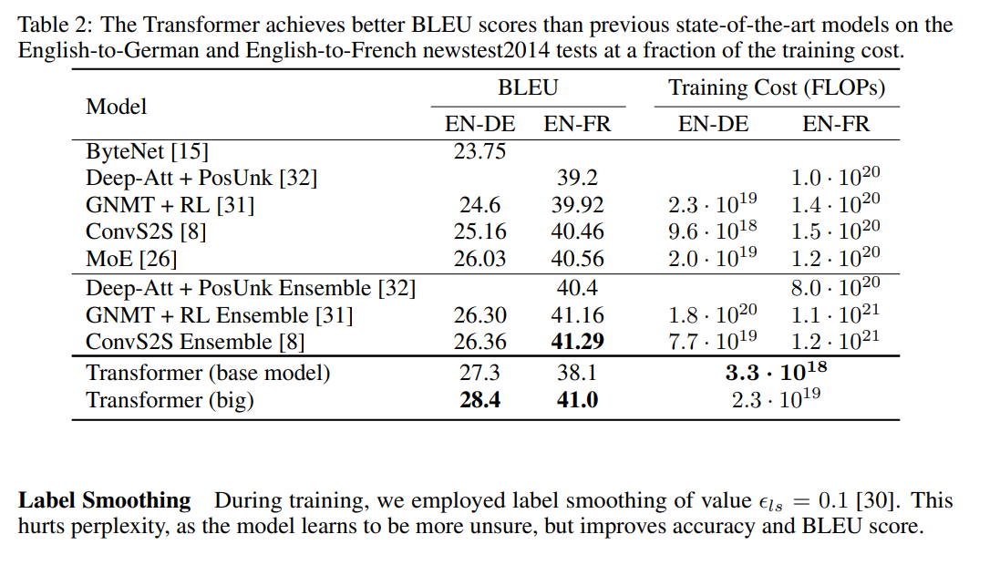

In [11]:
display(Image.open("/content/drive/MyDrive/ade/tabel.png"))

In [12]:
task = """
Extract the Training Cost (FLOPs) for EN-DE for ALL methods from the "/content/drive/MyDrive/ade/tabel.png"
using the OCR tool.
Return as a list with model name and its training cost.
"""

# First, get the raw OCR output
ocr_output = ocr_read_document.run("/content/drive/MyDrive/ade/tabel.png")

inputs = {"messages": [HumanMessage(content=task)]}
response = agent.invoke(inputs)

# Display results side by side
print("="*80)
print(" " * 22 + "OCR TABLE RESULTS")
print("="*80)
print("\n" + "─"*35 + " OCR OUTPUT " + "─"*33)
print(ocr_output[:600] + "..." if len(ocr_output) > 600 else ocr_output)
print("\n" + "─"*35 + " LLM RESULT " + "─"*33)
print(response['messages'][-1].content)
print("="*80)

                      OCR TABLE RESULTS

─────────────────────────────────── OCR OUTPUT ─────────────────────────────────
Table 2: The Transformer achieves better BLEU scores than previous state-of-the-art models on the
English-to-German and English-to-French newstest2014 tests at a fraction of the training cost.

 

 

 

 

BLEU Training Cost (FLOPs)

Model
EN-DE EN-FR EN-DE EN-FR

ByteNet [15] 23.75
Deep-Att + PosUnk [32] 39.2 1.0 - 10°
GNMT + RL [31] 24.6 39.92 2.3-10'% 1.4. 107°
ConvS$2S [8] 25.16 40.46 9.6-10!8 1.5 107°
MoE [26] 26.03 40.56 2.0-10'% 1.2. 107°
Deep-Att + PosUnk Ensemble [32] 40.4 8.0 - 102°
GNMT + RL Ensemble [31] 26.30 41.16 1.8-1079  1.1-1074
ConvS2S Ensemble [8] 26.36 41.29 7.7-10!9 1.2.1...

─────────────────────────────────── LLM RESULT ─────────────────────────────────
**Training‑Cost (FLOPs) for EN‑DE (all methods shown in the table)**  

| Model | Training Cost (EN‑DE) |
|-------|----------------------|
| GNMT + RL | ≈ 2.3 × 10¹⁰ FLOPs |
| ConvS2S | ≈ 9.6 

There are several issues with the results:

- Exponents become apostrophes
- Decimals become exclamation points
- Columns are misaligned

While the LLM can recognize patterns like empty cells, it may extract incorrect values from wrong columns due to garbled OCR output.


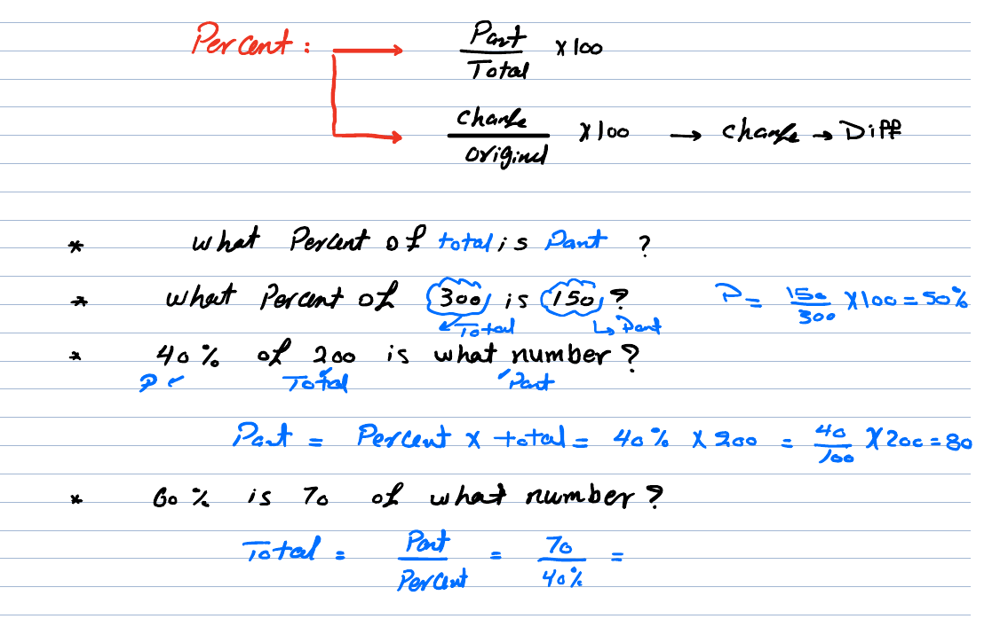

In [13]:
# Handwriting
display(Image.open("/content/drive/MyDrive/ade/percent.png"))

In [14]:
task = """
Please process the document at '/content/drive/MyDrive/ade/percent.png' using the OCR tool.
The image contains handwritten math notes about Percentages.

Please extract the information and return it in the following JSON format:
- `topic`: The main title of the notes.
- `formulas`: A list of the mathematical formulas written at the top.
- `solved_examples`: A list of the problems shown in the notes. For each example, include:
    - `question`: The text of the question .
    - `solution`: The mathematical step/calculation.
"""

# First, get the raw OCR output
ocr_output = ocr_read_document.run("/content/drive/MyDrive/ade/percent.png")

inputs = {"messages": [HumanMessage(content=task)]}
response = agent.invoke(inputs)

# Display results side by side
print("="*80)
print(" " * 22 + "HANDWRITTEN WORKSHEET RESULTS")
print("="*80)
print("\n" + "─"*35 + " OCR OUTPUT " + "─"*33)
print(ocr_output[:600] + "..." if len(ocr_output) > 600 else ocr_output)
print("\n" + "─"*35 + " LLM RESULT " + "─"*33)
print(response['messages'][-1].content)
print("="*80)

                      HANDWRITTEN WORKSHEET RESULTS

─────────────────────────────────── OCR OUTPUT ─────────────────────────────────
Charke

x) ch Di Pe
Original 00» Chae

 

uhet Poytnt off totals s Pant 2
whet Poem} off (Bee; is P50)? Ps ‘E> Aloo = 30%
Fetal a

Ly Dod
4o%  % Aco is what number 2
pe Foal “Pace

Pt = Pertert X +etel = 4a% XAac = =. XH 2ac = 80
‘oe
60% is To of what number 7

jetel, Pot 1 Fe -
Pov tut Yo%


─────────────────────────────────── LLM RESULT ─────────────────────────────────
```json
{
  "topic": "Percentages",
  "formulas": [
    "Percent = (Part ÷ Whole) × 100",
    "Part = (Percent × Whole) ÷ 100",
    "Whole = (Part × 100) ÷ Percent"
  ],
  "solved_examples": [
    {
      "question": "What percent of 50 is 20?",
      "solution": "Percent = (20 ÷ 50) × 100 = 40 %"
    },
    {
      "question": "30 % of what number equals 15?",
      "solution": "0.30 × X = 15 → X = 15 ÷ 0.30 = 50"
    },
    {
      "question": "40 % of a number equals 80. What is the

In [15]:
task = """
You are analyzing handwritten math notes about Percentages from an OCR output.
The OCR output is messy and contains typos (e.g., 'Pant' instead of 'Part', 'Bee' instead of '300').

Here is the raw OCR text you need to process:
"/content/drive/MyDrive/ade/percent.png"
Your task is to reconstruct the original math problems based on the fragments visible.
Looking at the original image context (which implies standard percent formulas):
1. Correct the typos (e.g., '15a' might be '150', '2ac' might be '200').
2. Extract the 3 specific examples visible in the notes.

Return the result in JSON format:
- `topic`: "Percentages"
- `formulas`: Extract formulas like "Part/Total * 100".
- `solved_examples`:
    1. The example about 300 and 150.
    2. The example about 40% and 200.
    3. The example about 60% and 70.
"""
# First, get the raw OCR output
ocr_output = ocr_read_document.run("/content/drive/MyDrive/ade/percent.png")

inputs = {"messages": [HumanMessage(content=task)]}
response = agent.invoke(inputs)

# Display results side by side
print("="*80)
print(" " * 22 + "HANDWRITTEN WORKSHEET RESULTS")
print("="*80)
print("\n" + "─"*35 + " OCR OUTPUT " + "─"*33)
print(ocr_output[:600] + "..." if len(ocr_output) > 600 else ocr_output)
print("\n" + "─"*35 + " LLM RESULT " + "─"*33)
print(response['messages'][-1].content)
print("="*80)

                      HANDWRITTEN WORKSHEET RESULTS

─────────────────────────────────── OCR OUTPUT ─────────────────────────────────
Charke

x) ch Di Pe
Original 00» Chae

 

uhet Poytnt off totals s Pant 2
whet Poem} off (Bee; is P50)? Ps ‘E> Aloo = 30%
Fetal a

Ly Dod
4o%  % Aco is what number 2
pe Foal “Pace

Pt = Pertert X +etel = 4a% XAac = =. XH 2ac = 80
‘oe
60% is To of what number 7

jetel, Pot 1 Fe -
Pov tut Yo%


─────────────────────────────────── LLM RESULT ─────────────────────────────────
```json
{
  "topic": "Percentages",
  "formulas": [
    "Percent = (Part ÷ Total) × 100",
    "Part = (Percent ÷ 100) × Total",
    "Total = Part × 100 ÷ Percent"
  ],
  "solved_examples": [
    {
      "description": "What percent is 150 of 300?",
      "given": {
        "part": 150,
        "total": 300
      },
      "solution": {
        "formula": "Percent = (Part ÷ Total) × 100",
        "calculation": "(150 ÷ 300) × 100 = 0.5 × 100 = 50",
        "answer": "150 is 50 % of 300."

**Note**: enhanced prompt result

Here's what we covered:

|  | Applications | Limitations |
|-----------|----------|------------|
| **OCR** | Good at parsing simple text | Bad at tables, handwriting, low-quality scans |
| **Regex** | Good at pattern matching | Bad at handling variations in text |
| **Agent** | Can adapt to variations in text | Dependent on OCR quality; otherwise may hallucinate |


# Document Processing with PaddleOCR

How OCR has evolved over time from Tesseract to PaddleOCR.

## Background

Tesseract represents the traditional computer vision era. It uses hand-engineered features and procedural rules. PaddleOCR represents the modern deep learning era. It uses neural networks in two steps:

1. **Text Detection**: Locate all text regions in the image
2. **Text Recognition**: Decode the text content from each region

In [6]:
import os
from google.colab import userdata
GROQ_API_KEY = userdata.get('GROQ_API')


In [3]:
# import libraries
from langchain_core.messages import HumanMessage
from langchain.agents import create_agent
from langchain_groq import ChatGroq
from langchain.tools import tool

from paddleocr import PaddleOCR ,LayoutDetection

from IPython.display import display
import matplotlib.pyplot as plt
from matplotlib import colormaps
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import cv2

from typing import List, Dict, Any
from pathlib import Path

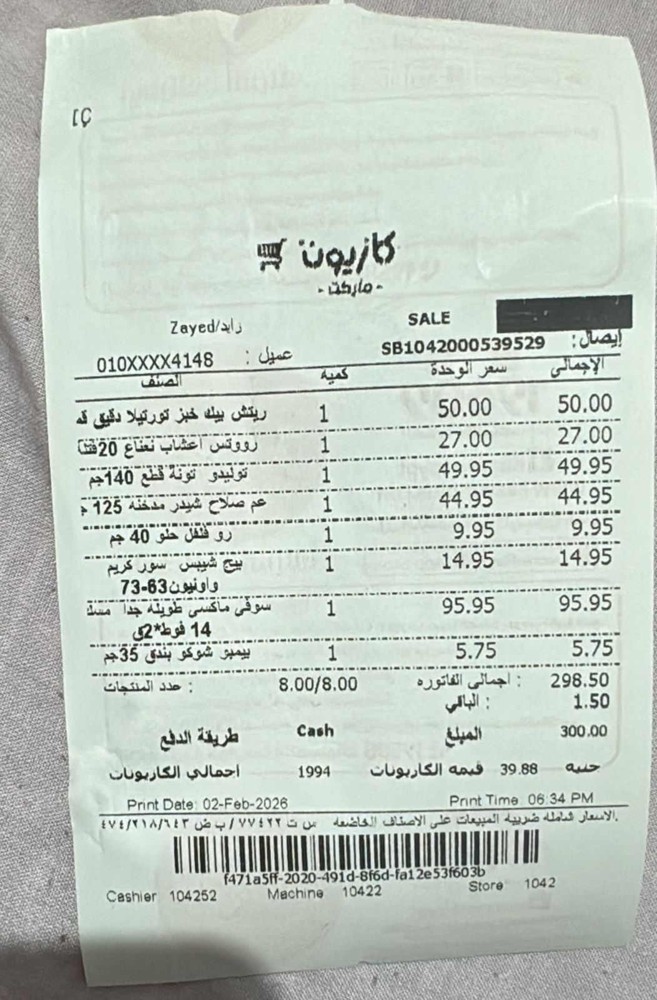

In [4]:
image_path = '/content/drive/MyDrive/ade/invoice2.jpg'
display(Image.open(image_path))

In [5]:
# Initialize Arabic OCR model
ar_ocr = PaddleOCR(lang='ar', enable_mkldnn=False)

/usr/local/lib/python3.12/dist-packages/paddle/utils/cpp_extension/extension_utils.py:712: UserWarning: No ccache found. Please be aware that recompiling all source files may be required. You can download and install ccache from: https://github.com/ccache/ccache/blob/master/doc/INSTALL.md
  warnings.warn(warning_message)
Creating model: ('PP-LCNet_x1_0_doc_ori', None)
Using official model (PP-LCNet_x1_0_doc_ori), the model files will be automatically downloaded and saved in `/root/.paddlex/official_models/PP-LCNet_x1_0_doc_ori`.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

Creating model: ('UVDoc', None)
Using official model (UVDoc), the model files will be automatically downloaded and saved in `/root/.paddlex/official_models/UVDoc`.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

Creating model: ('PP-LCNet_x1_0_textline_ori', None)
Using official model (PP-LCNet_x1_0_textline_ori), the model files will be automatically downloaded and saved in `/root/.paddlex/official_models/PP-LCNet_x1_0_textline_ori`.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

Creating model: ('PP-OCRv5_server_det', None)
Using official model (PP-OCRv5_server_det), the model files will be automatically downloaded and saved in `/root/.paddlex/official_models/PP-OCRv5_server_det`.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

Creating model: ('arabic_PP-OCRv5_mobile_rec', None)
Using official model (arabic_PP-OCRv5_mobile_rec), the model files will be automatically downloaded and saved in `/root/.paddlex/official_models/arabic_PP-OCRv5_mobile_rec`.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

In [7]:
result = ar_ocr.predict(image_path)
texts = result[0]['rec_texts']
scores = result[0]['rec_scores']
boxes  = result[0]['rec_polys']

for text, score, box in zip(texts, scores, boxes):
    coords = box.astype(int).tolist()
    print(f"{text:25} | {score:.3f} | {coords}")

[C                        | 0.911 | [[51, 132], [102, 136], [99, 180], [48, 176]]
كازيون                    | 0.710 | [[378, 357], [637, 360], [636, 439], [377, 436]]
٠ماركت                    | 0.892 | [[483, 428], [608, 430], [607, 469], [482, 467]]
Zayed/aزاي                | 0.774 | [[223, 478], [360, 478], [360, 516], [223, 516]]
SALE                      | 0.999 | [[639, 485], [722, 485], [722, 517], [639, 517]]
010XXXX4148               | 0.992 | [[90, 528], [307, 528], [307, 563], [90, 563]]
عميل                      | 0.997 | [[351, 524], [441, 524], [441, 561], [351, 561]]
SB1042000539529           | 0.999 | [[591, 526], [883, 530], [882, 561], [591, 557]]
الصنف                     | 0.905 | [[167, 561], [248, 561], [248, 590], [167, 590]]
كميه                      | 0.869 | [[478, 558], [544, 558], [544, 601], [478, 601]]
سعر الوحدة                | 0.997 | [[675, 562], [816, 567], [815, 603], [674, 598]]
الإجمالى                  | 0.908 | [[888, 568], [985, 568], [985, 604

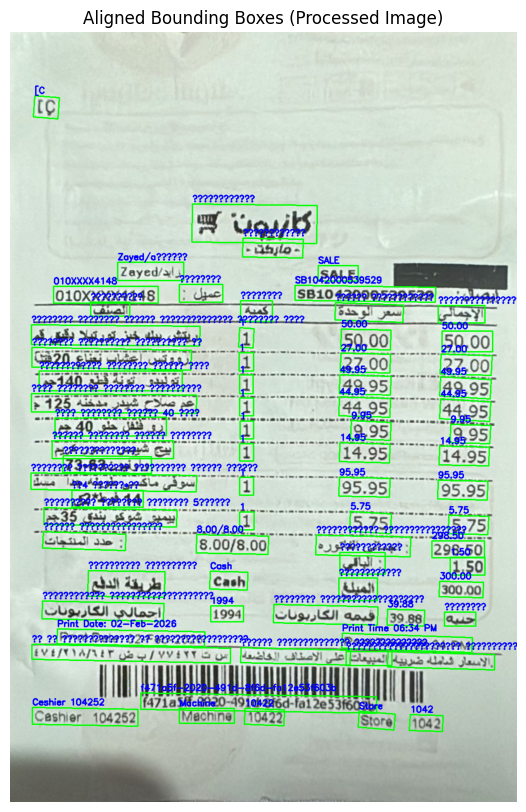

In [8]:
img = result[0]['doc_preprocessor_res']['output_img']
img_plot = img.copy()

for text, box in zip(texts, boxes):
    pts = np.array(box, dtype=int)
    cv2.polylines(img_plot, [pts], True, (0, 255, 0), 2)
    x, y = pts[0]
    cv2.putText(img_plot, text, (x, y - 5),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

plt.figure(figsize=(8, 10))
plt.imshow(cv2.cvtColor(img_plot, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("Aligned Bounding Boxes (Processed Image)")
plt.show()

In [11]:
!wget https://cdn.jsdelivr.net/gh/notofonts/notofonts.github.io/fonts/NotoSansArabic/unhinted/ttf/NotoSansArabic-Regular.ttf -O arabic_font.ttf
!file arabic_font.ttf

--2026-02-10 00:27:38--  https://cdn.jsdelivr.net/gh/notofonts/notofonts.github.io/fonts/NotoSansArabic/unhinted/ttf/NotoSansArabic-Regular.ttf
Resolving cdn.jsdelivr.net (cdn.jsdelivr.net)... 151.101.1.229, 151.101.65.229, 151.101.129.229, ...
Connecting to cdn.jsdelivr.net (cdn.jsdelivr.net)|151.101.1.229|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 142140 (139K) [font/ttf]
Saving to: ‘arabic_font.ttf’

arabic_font.ttf     100%[===================>] 138.81K  --.-KB/s    in 0.004s  

2026-02-10 00:27:38 (32.9 MB/s) - ‘arabic_font.ttf’ saved [142140/142140]

arabic_font.ttf: TrueType Font data, 13 tables, 1st "GDEF", 15 names, Microsoft, language 0x409, Copyright 2022 The Noto Project Authors (https://github.com/notofonts/arabic)Noto Sans ArabicReg


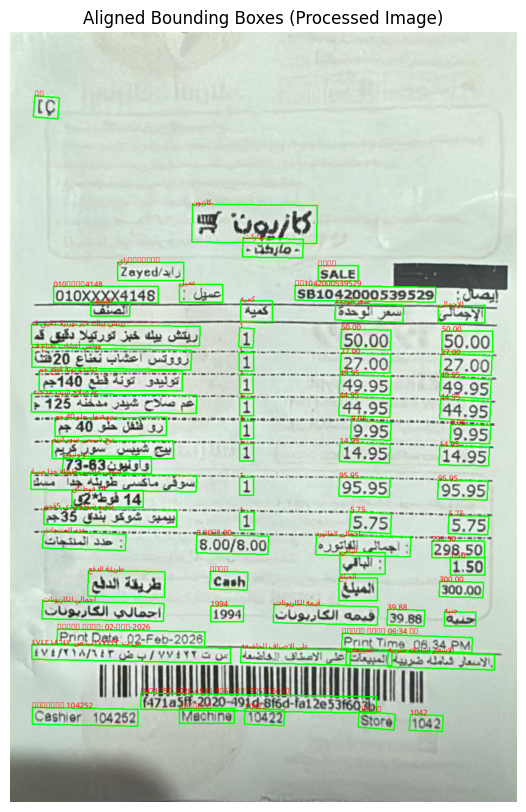

In [12]:
img = result[0]['doc_preprocessor_res']['output_img']
img_plot = img.copy()

for box in boxes:
    pts = np.array(box, dtype=int)
    cv2.polylines(img_plot, [pts], True, (0, 255, 0), 2)

img_plot = cv2.cvtColor(img_plot, cv2.COLOR_BGR2RGB)

pil_img = Image.fromarray(img_plot)
draw = ImageDraw.Draw(pil_img)


font = ImageFont.truetype("arabic_font.ttf", 16)

for text, box in zip(texts, boxes):
    pts = np.array(box, dtype=int)
    x, y = pts[0]
    draw.text((x, y - 20), text, font=font, fill=(255, 0, 0), direction="rtl", align="right")

img_plot = np.array(pil_img)

plt.figure(figsize=(8, 10))
plt.imshow(img_plot)
plt.axis("off")
plt.title("Aligned Bounding Boxes (Processed Image)")
plt.show()

In [20]:
@tool
def paddle_ocr_read_document(image_path: str) -> List[Dict[str, Any]]:
    """
    Reads an image from the given path and returns extracted text
    with bounding boxes.

    Returns a list of dictionaries, each containing:
    - 'text': the recognized text string
    - 'bbox': bounding box coordinates [x_min, y_min, x_max, y_max]
    - 'confidence': recognition confidence score (if available)
    """
    try:
        result = ar_ocr.predict(image_path)

        texts = result[0]['rec_texts']
        boxes = result[0]['dt_polys']
        scores = result[0].get('rec_scores', [None] * len(texts))

        extracted_items = []
        for text, box, score in zip(texts, boxes, scores):
            x_coords = [point[0] for point in box]
            y_coords = [point[1] for point in box]
            bbox = [min(x_coords), min(y_coords), max(x_coords),
                    max(y_coords)]

            item = {
                'text': text,
                'bbox': bbox,
            }
            if score is not None:
                item['confidence'] = score

            extracted_items.append(item)

        return extracted_items

    except Exception as e:
        return [{"error": f"Error reading image: {e}"}]


# create Agent
llm = ChatGroq(
    model="openai/gpt-oss-120b",
    groq_api_key=GROQ_API_KEY,
    temperature=1
)

tools = [paddle_ocr_read_document]

system_prompt = """
You are an expert invoice processing assistant.
You have access to the 'paddle_ocr_read_document' tool to extract raw text from images.

YOUR PROCESS:
1. Call 'paddle_ocr_read_document' to get the text from the image.
2. Identify the line items and their individual prices from the OCR output.
3. EXTRACT the prices as a list in your thought process.
4. CALCULATE the sum manually step-by-step in your final response to verify the total.

CRITICAL INSTRUCTION:
- Do NOT attempt to write code or use a Python tool for calculation.
- You must perform the arithmetic yourself based on the text you extracted.
- If the OCR result is messy, do your best to reconstruct the numbers.
"""
agent = create_agent(
    model=llm,
    tools=tools,
    system_prompt=system_prompt
)

task = """
Process the document at '/content/drive/MyDrive/ade/invoice2.jpg'.
Read the items and prices, then verify if the printed total is correct by summing the prices yourself in the response.
"""

inputs = {"messages": [HumanMessage(content=task)]}
response = agent.invoke(inputs)

print(response['messages'][-1].content)

**Extracted line‑items and their prices**

| # | Item (as read from the invoice) | Quantity | Unit price (AED) | Line total (AED) |
|---|--------------------------------|----------|------------------|------------------|
| 1 | ريتش بيلك خبز تورتيلا دقيق قه | 1 | 50.00 | 50.00 |
| 2 | ووتس أعشاب نعناع ف | 1 | 27.00 | 27.00 |
| 3 | توليدو تونة قطع جم | 1 | 49.95 | 49.95 |
| 4 | عم صلاح شيدر مدخنه | 1 | 44.95 | 44.95 |
| 5 | رو فنفل حلو 40 جم | 1 | 9.95 | 9.95 |
| 6 | بيج شيبس سور كريم | 1 | 14.95 | 14.95 |
| 7 | سوفى ماكسى طويله جدا مسة (واونيون) | 1 | 95.95 | 95.95 |
| 8 | بيمبو شوكو بندي 5قجم | 1 | 5.75 | 5.75 |

**Manual calculation of the total**

1. 50.00 + 27.00 = 77.00  
2. 77.00 + 49.95 = 126.95  
3. 126.95 + 44.95 = 171.90  
4. 171.90 + 9.95 = 181.85  
5. 181.85 + 14.95 = 196.80  
6. 196.80 + 95.95 = 292.75  
7. 292.75 + 5.75 = 298.50  

**Result**

- The sum of all line‑item amounts is **298.50 AED**.  
- The invoice prints the total as **298.50 AED** (shown under “اجمالى الفاتو

##  Run PaddleOCR on the Table and Handwriting Examples


In [18]:
# Initialize en OCR model
ocr = PaddleOCR(lang='en', enable_mkldnn=False)
def run_ocr(image_path, ocr_model = ocr, show_text = True):

    display(Image.open(image_path))
    result = ocr.predict(image_path)

    page = result[0]
    texts  = page['rec_texts']
    scores = page['rec_scores']
    boxes  = page['rec_polys']

    for text, score, box in zip(texts, scores, boxes):
        coords = box.astype(int).tolist()
        print(f"{text:25} | {score:.3f} | {coords}")

    img = page['doc_preprocessor_res']['output_img']
    img_plot = img.copy()

    image_path = Path(image_path)
    output_path = image_path.with_stem(image_path.stem + "_output")
    cv2.imwrite(str(output_path), img)

    for text, box in zip(texts, boxes):
        pts = np.array(box, dtype=int)
        cv2.polylines(img_plot, [pts], True, (0, 255, 0), 2)
        x, y = pts[0]
        if show_text:
            cv2.putText(img_plot, text,
                        (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX,
                        0.6, (255, 0, 0), 2)

    plt.figure(figsize=(8, 10))
    plt.imshow(cv2.cvtColor(img_plot, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title("Aligned Bounding Boxes (Processed Image)")
    plt.show()

Creating model: ('PP-LCNet_x1_0_doc_ori', None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/PP-LCNet_x1_0_doc_ori`.
Creating model: ('UVDoc', None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/UVDoc`.
Creating model: ('PP-LCNet_x1_0_textline_ori', None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/PP-LCNet_x1_0_textline_ori`.
Creating model: ('PP-OCRv5_server_det', None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/PP-OCRv5_server_det`.
Creating model: ('en_PP-OCRv5_mobile_rec', None)
Using official model (en_PP-OCRv5_mobile_rec), the model files will be automatically downloaded and saved in `/root/.paddlex/official_models/en_PP-OCRv5_mobile_r

Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

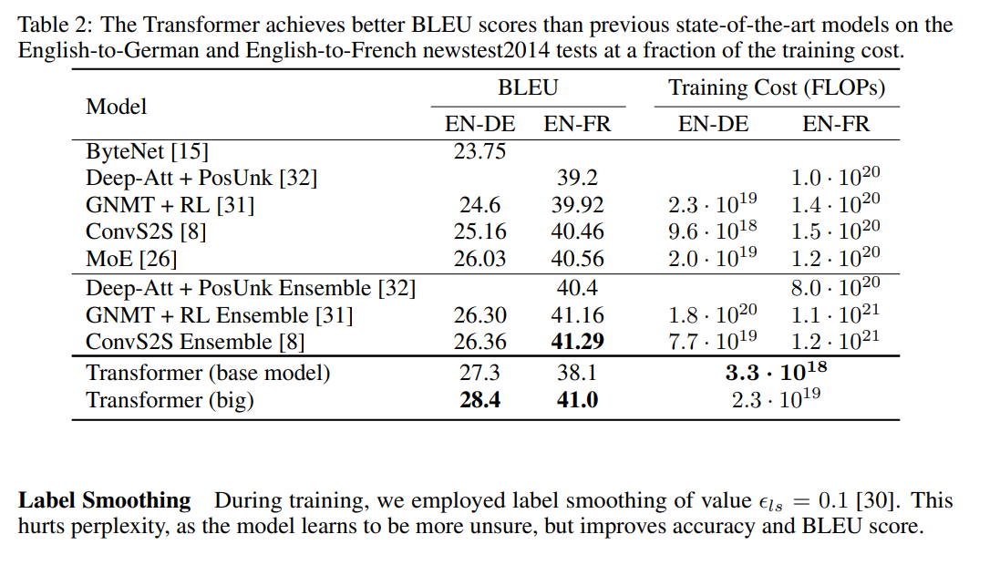

Table 2: The Transformer achieves better BLEU scores than previous state-of-the-art models on the | 0.984 | [[5, 0], [1081, 0], [1081, 26], [5, 24]]
English-to-German and English-to-French newstest2014 tests at a fraction of the training cost. | 0.977 | [[0, 20], [1026, 25], [1026, 56], [0, 52]]
BLEU                      | 1.000 | [[554, 64], [632, 64], [632, 94], [554, 94]]
Training Cost (FLOPs)     | 0.998 | [[752, 66], [1004, 68], [1004, 96], [752, 94]]
Model                     | 1.000 | [[75, 84], [156, 87], [155, 118], [74, 115]]
EN-DE                     | 1.000 | [[493, 107], [582, 107], [582, 136], [493, 136]]
EN-FR                     | 1.000 | [[606, 108], [693, 108], [693, 137], [606, 137]]
EN-DE                     | 1.000 | [[760, 108], [850, 108], [850, 137], [760, 137]]
EN-FR                     | 1.000 | [[904, 111], [987, 111], [987, 137], [904, 137]]
ByteNet [15]              | 1.000 | [[74, 138], [228, 140], [228, 176], [73, 173]]
23.75                     | 1.000 |

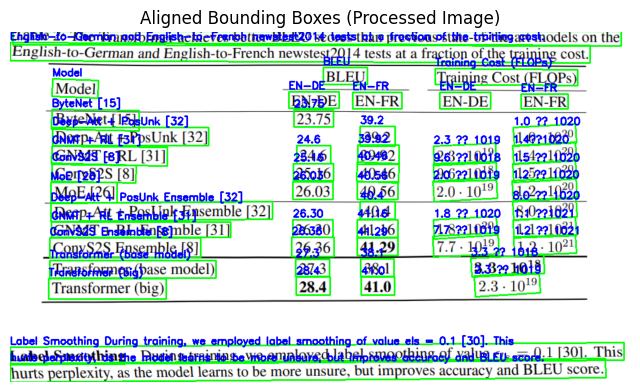

In [19]:
run_ocr("/content/drive/MyDrive/ade/tabel.png")

Inspect the output for errors. Notice exponential notation issues—`10^20` may be read as `1020`. This affects both PaddleOCR and Tesseract.

In [21]:
@tool
def paddle_ocr_read_document(image_path: str) -> List[Dict[str, Any]]:
    """
    Reads an image from the given path and returns extracted text
    with bounding boxes.

    Returns a list of dictionaries, each containing:
    - 'text': the recognized text string
    - 'bbox': bounding box coordinates [x_min, y_min, x_max, y_max]
    - 'confidence': recognition confidence score (if available)
    """
    try:
        result = ocr.predict(image_path)

        texts = result[0]['rec_texts']
        boxes = result[0]['dt_polys']
        scores = result[0].get('rec_scores', [None] * len(texts))

        extracted_items = []
        for text, box, score in zip(texts, boxes, scores):
            x_coords = [point[0] for point in box]
            y_coords = [point[1] for point in box]
            bbox = [min(x_coords), min(y_coords), max(x_coords),
                    max(y_coords)]

            item = {
                'text': text,
                'bbox': bbox,
            }
            if score is not None:
                item['confidence'] = score

            extracted_items.append(item)

        return extracted_items

    except Exception as e:
        return [{"error": f"Error reading image: {e}"}]


# create Agent
llm = ChatGroq(
    model="openai/gpt-oss-120b",
    groq_api_key=GROQ_API_KEY,
    temperature=1
)

tools = [paddle_ocr_read_document]

system_prompt = """
You are a helpful assistant designed to extract information from documents.
You have access to this tool:
Paddle OCR tool to extract raw texts, bounding boxes for each text and confidence score from images
"""
agent = create_agent(
    model=llm,
    tools=tools,
    system_prompt=system_prompt
)

task = """
Extract the Training Cost (FLOPs) for EN-DE for ALL methods from
the /content/drive/MyDrive/ade/tabel.png using the OCR tool.
Return as a list with model name and its training cost.
"""

inputs = {"messages": [HumanMessage(content=task)]}
response = agent.invoke(inputs)

print("\n" + "─"*35 + " LLM RESULT " + "─"*33)
print("="*80)
print(response['messages'][-1].content)
print("="*80)


─────────────────────────────────── LLM RESULT ─────────────────────────────────
**Training Cost (FLOPs) for EN‑DE (all methods shown in the table)**  

| Model | EN‑DE Training Cost (FLOPs) |
|-------|-----------------------------|
| ByteNet [15] | – (not reported in the table) |
| Deep‑Att + PosUnk [32] | 1.0 · 10²⁰ |
| GNMT + RL [31] | 2.3 · 10¹⁹ |
| ConvS2S [8] | 9.6 · 10¹⁸ |
| MoE [26] | 2.0 · 10¹⁹ |
| Deep‑Att + PosUnk Ensemble [32] | 8.0 · 10²⁰ |
| GNMT + RL Ensemble [31] | 1.8 · 10²⁰ |
| ConvS2S Ensemble [8] | 7.7 · 10¹⁹ |
| Transformer (base model) | 3.3 · 10¹⁸ |
| Transformer (big) | 2.3 · 10¹⁹ |

*The values are taken directly from the “Training Cost (FLOPs)” column under the EN‑DE heading in the OCR‑extracted table.*


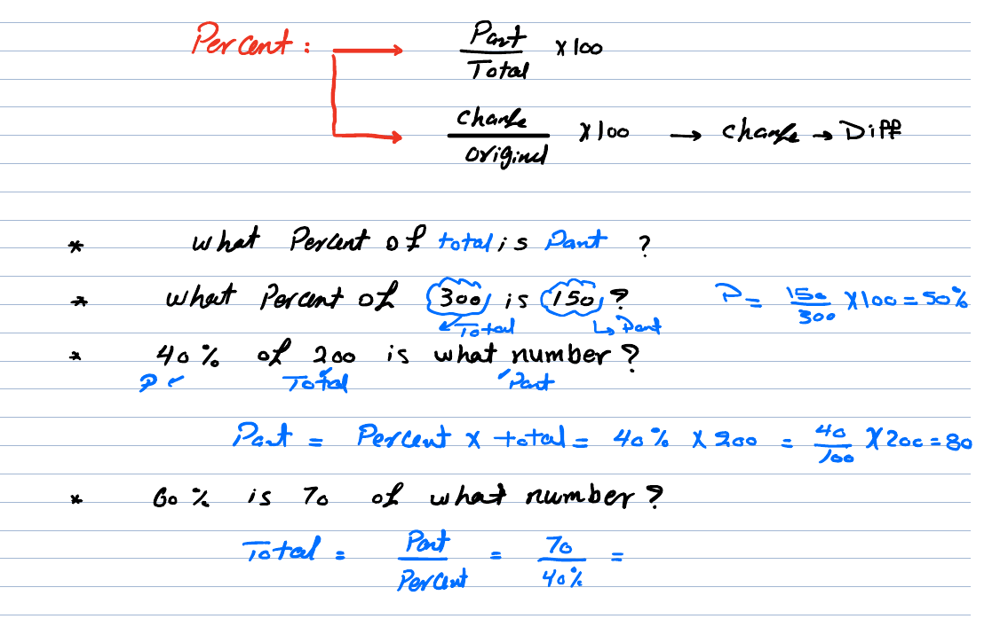

Percent                   | 0.991 | [[72, 0], [214, 2], [214, 42], [71, 39]]
Part                      | 0.947 | [[442, 0], [527, 0], [526, 34], [441, 31]]
X 100                     | 0.849 | [[552, 7], [627, 7], [627, 44], [552, 44]]
Total                     | 0.998 | [[434, 32], [528, 35], [527, 71], [433, 68]]
Chanke                    | 0.924 | [[415, 93], [519, 97], [518, 132], [414, 129]]
x100                      | 0.876 | [[577, 107], [665, 107], [665, 147], [577, 147]]
→ chanp →Diff             | 0.729 | [[711, 107], [1038, 109], [1037, 150], [711, 148]]
Origind                   | 0.846 | [[424, 138], [546, 140], [545, 176], [423, 173]]
what Percent of totalis Pant ? | 0.866 | [[23, 244], [697, 242], [697, 286], [23, 288]]
what Percnt oh 30o is (150? | 0.754 | [[0, 315], [670, 312], [671, 366], [0, 369]]
?-                        | 0.646 | [[769, 319], [840, 319], [840, 353], [769, 353]]
15                        | 0.810 | [[864, 321], [932, 324], [931, 353], [863, 351]]
X10

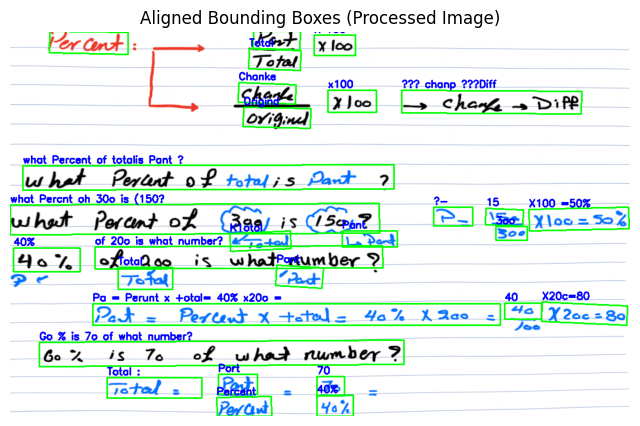

In [22]:
run_ocr("/content/drive/MyDrive/ade/percent.png")

In [23]:
task = """
Please process the document at '/content/drive/MyDrive/ade/percent.png' using the OCR tool.
The image contains handwritten math notes about Percentages.

Please extract the information and return it in the following JSON format:
- `topic`: The main title of the notes.
- `formulas`: A list of the mathematical formulas written at the top.
- `solved_examples`: A list of the problems shown in the notes. For each example, include:
    - `question`: The text of the question .
    - `solution`: The mathematical step/calculation.
"""

inputs = {"messages": [HumanMessage(content=task)]}
response = agent.invoke(inputs)

print("\n" + "─"*35 + " LLM RESULT " + "─"*33)
print(response['messages'][-1].content)



─────────────────────────────────── LLM RESULT ─────────────────────────────────
**Extracted Information**

```json
{
  "topic": "Percent",
  "formulas": [
    "Percent = (Part ÷ Total) × 100",
    "Part = (Percent × Total) ÷ 100",
    "Total = (Part × 100) ÷ Percent"
  ],
  "solved_examples": [
    {
      "question": "What percent of the total is 15?",
      "solution": "15 × 100 = 1500 % (as shown in the notes: “15 X 100 = 50 %” – the handwritten note appears to simplify the calculation as 15 × 100, then state the resulting percent)."
    },
    {
      "question": "40 % of 200 is what number?",
      "solution": "40 % × 200 = 80"
    },
    {
      "question": "90 % is 70 of what number?",
      "solution": "Total = 70 ÷ 0.90 ≈ 77.78"
    }
  ]
}
```


<a id="2"></a>

## PaddleOCR Limitations

PaddleOCR had few errors than Tesseract. However handwriting remained challenging. Let's test PaddleOCR on other challenging cases to expose its limitations.

### Charts and Figures

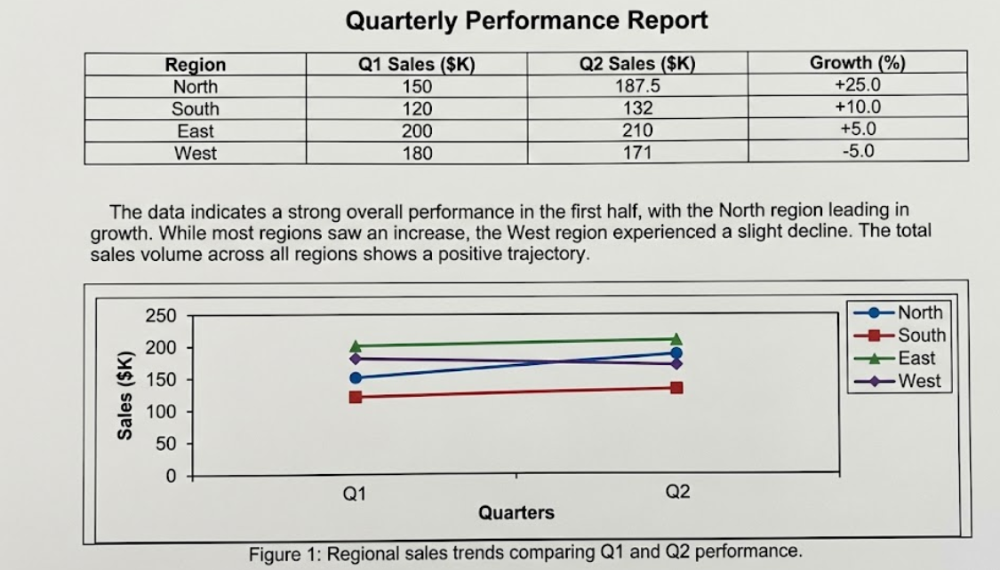

Quarterly Performance Report | 0.998 | [[359, 0], [804, 0], [804, 25], [359, 24]]
Region                    | 1.000 | [[138, 44], [216, 46], [215, 71], [137, 69]]
Q1 Sales ($K)             | 0.983 | [[370, 42], [516, 42], [516, 69], [370, 69]]
Q2 Sales ($K)             | 0.996 | [[637, 40], [787, 42], [786, 69], [637, 67]]
Growth (%)                | 0.909 | [[923, 43], [1050, 45], [1049, 70], [923, 68]]
North                     | 0.968 | [[145, 68], [204, 70], [203, 96], [144, 93]]
150                       | 1.000 | [[421, 68], [463, 68], [463, 92], [421, 92]]
187.5                     | 1.000 | [[680, 67], [742, 67], [742, 92], [680, 92]]
+25.0                     | 1.000 | [[956, 71], [1019, 71], [1019, 93], [956, 93]]
South                     | 1.000 | [[141, 93], [205, 96], [204, 121], [140, 118]]
120                       | 1.000 | [[420, 94], [462, 94], [462, 117], [420, 117]]
132                       | 1.000 | [[689, 94], [731, 94], [731, 118], [689, 118]]
+10.0            

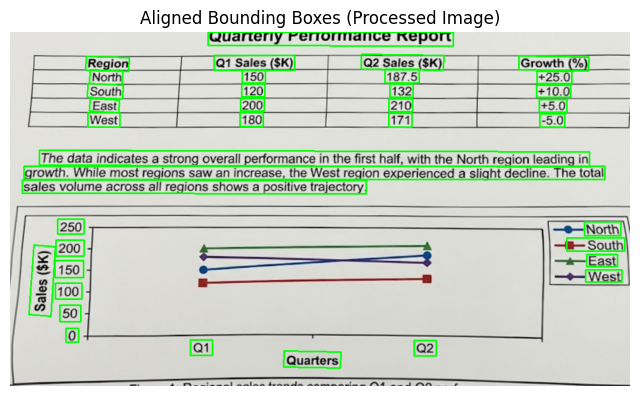

In [24]:
run_ocr("/content/drive/MyDrive/ade/report.png", show_text=False)

PaddleOCR did not recognize the chart as a region. Note the lack of a bounding box around it. While PaddleOCR detected labels on axes, there is no context for these label. For example, horizontal axis versus vertical axis.

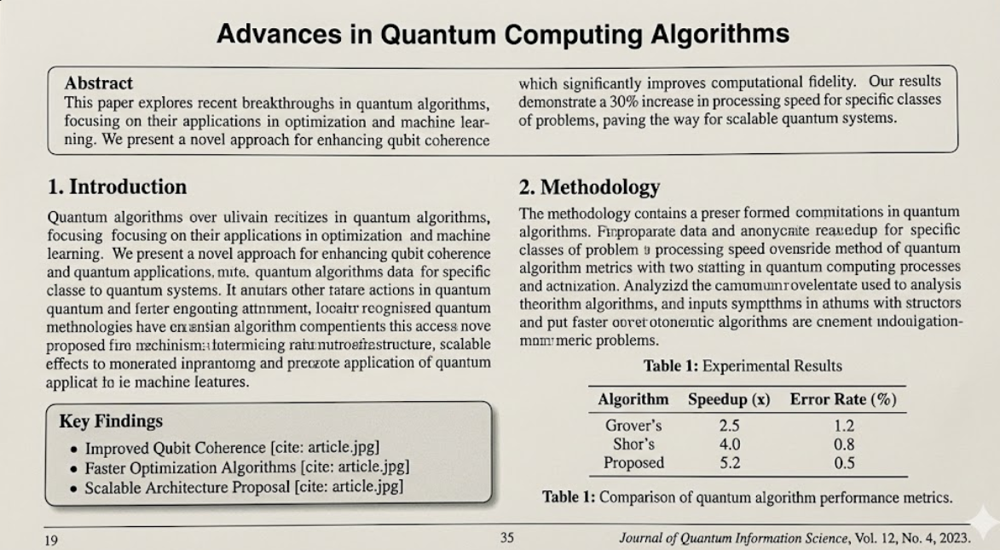

Advances in Quantum Computing Algorithms | 0.988 | [[238, 0], [961, 0], [961, 29], [238, 28]]
Abstract                  | 0.951 | [[45, 64], [138, 64], [138, 85], [45, 85]]
which significantly improves computational fidelity. Our results | 0.999 | [[616, 62], [1151, 63], [1151, 87], [616, 86]]
This paper explores recent breakthroughs in quantum algorithms, | 0.985 | [[43, 88], [583, 89], [583, 110], [43, 109]]
demonstrate a 30% increase in processing speed for specific classes | 0.994 | [[614, 85], [1151, 87], [1151, 110], [614, 108]]
focusing on their applications in optimization and machine lear- | 0.984 | [[41, 110], [583, 110], [583, 133], [41, 133]]
of problems, paving the way for scalable quantum systems. | 0.995 | [[614, 108], [1095, 110], [1095, 133], [614, 131]]
ning. We present a novel approach for enhancing qubit coherence | 0.999 | [[38, 131], [582, 133], [581, 156], [38, 154]]
1. Introduction           | 0.994 | [[7, 186], [193, 188], [193, 215], [7, 213]]
2. Methodology  

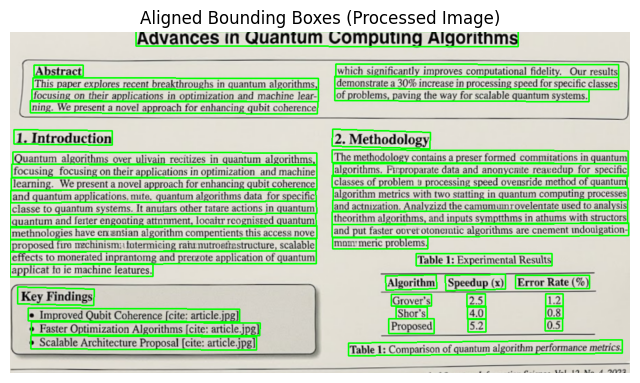

In [25]:
run_ocr("/content/drive/MyDrive/ade/articel.png", show_text=False)

PaddleOCR reads straight across all columns as opposed to down the left column, then the next column.


## PaddleOCR Layout Detection

PaddleOCR includes a layout detection module that identifies document regions (footer, tables, charts, etc) before text extraction.

This function processes images with the layout engine, returning:
- **label**: Region type (text, chart, table, etc.)
- **score**: Confidence score
- **bbox**: Bounding box coordinates

In [29]:
layout_engine = LayoutDetection(enable_mkldnn=False)

Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/PP-DocLayout_plus-L`.


In [31]:
def process_document(image_path):
    layout_result = layout_engine.predict(image_path)

    regions = []
    for box in layout_result[0]['boxes']:
        regions.append({
            'label': box['label'],
            'score': box['score'],
            'bbox': box['coordinate'],
        })

    regions = sorted(regions, key=lambda x: x['score'], reverse=True)

    return regions

In [32]:
regions = process_document("/content/drive/MyDrive/ade/report.png")

for r in regions:
    print(f"{r['label']:20} score: {r['score']:.3f}  bbox: {[int(x) for x in r['bbox']]}")

table                score: 0.985  bbox: [93, 56, 1088, 183]
text                 score: 0.966  bbox: [95, 225, 1047, 295]
chart                score: 0.940  bbox: [95, 316, 1089, 607]
figure_title         score: 0.821  bbox: [384, 8, 797, 36]
figure_title         score: 0.804  bbox: [273, 610, 902, 633]


In [33]:
def visualize_layout(image_path, min_confidence=0.5):

    layout_result = layout_engine.predict(image_path)

    img = cv2.imread(image_path)
    img_plot = img.copy()

    # Get all unique labels
    labels = list(set(box['label'] for box in layout_result[0]['boxes']))

    # Generate colors dynamically from colormap
    cmap = colormaps.get_cmap('tab20')
    color_map = {}
    for i, label in enumerate(labels):
        rgba = cmap(i % 20)
        # Convert to BGR (0-255) for OpenCV
        color_map[label] = (int(rgba[2]*255), int(rgba[1]*255), int(rgba[0]*255))

    for box in layout_result[0]['boxes']:
        if box['score'] < min_confidence:
            continue

        label = box['label']
        score = box['score']
        coords = box['coordinate']

        color = color_map[label]

        x1, y1, x2, y2 = [int(c) for c in coords]
        pts = np.array([[x1, y1], [x2, y1], [x2, y2], [x1, y2]], dtype=int)

        cv2.polylines(img_plot, [pts], True, color, 2)
        text = f"{label} ({score:.2f})"
        cv2.putText(img_plot, text, (x1, y1-8), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

    return img_plot

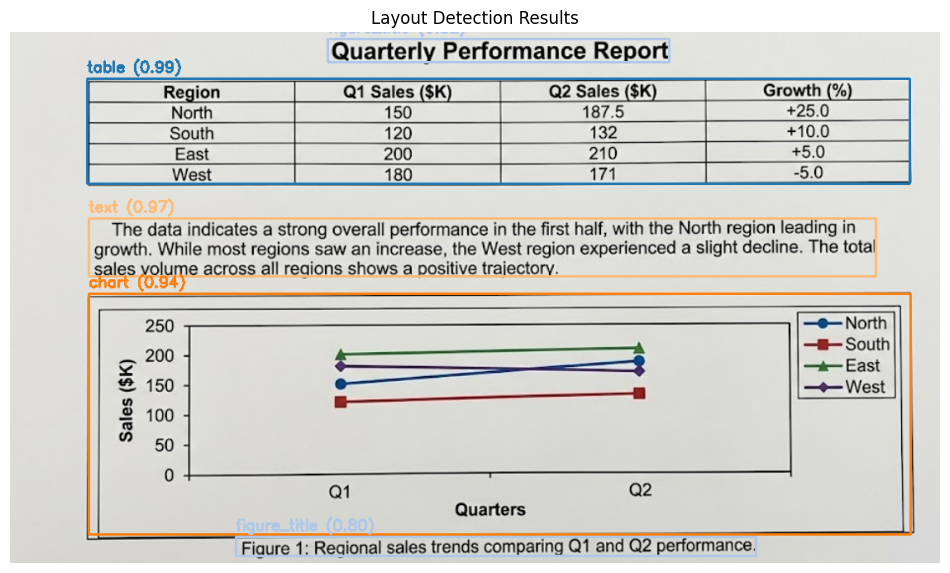

In [34]:
result_image = visualize_layout("/content/drive/MyDrive/ade/report.png", min_confidence=0.5)

plt.figure(figsize=(12, 14))
plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("Layout Detection Results")
plt.show()

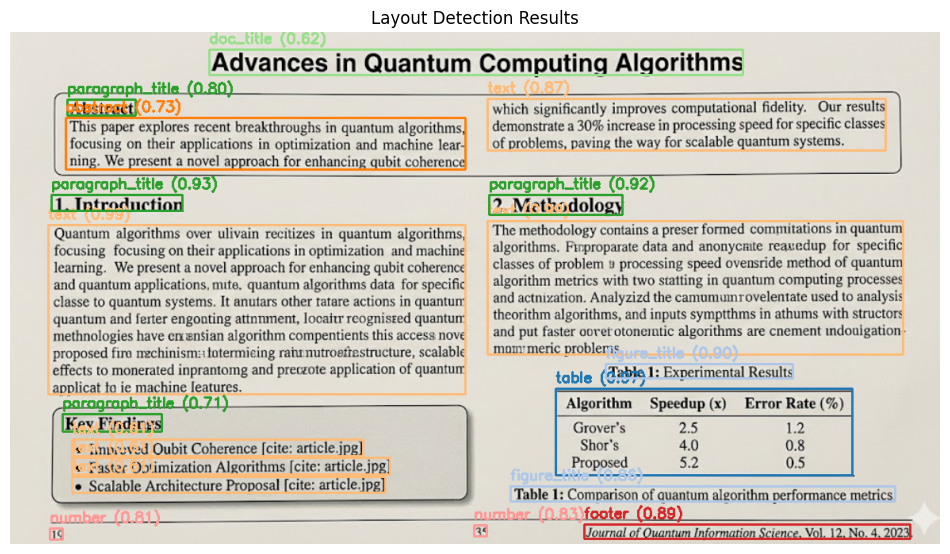

In [36]:
result_image = visualize_layout("/content/drive/MyDrive/ade/articel.png", min_confidence=0.5)

plt.figure(figsize=(12, 14))
plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("Layout Detection Results")
plt.show()

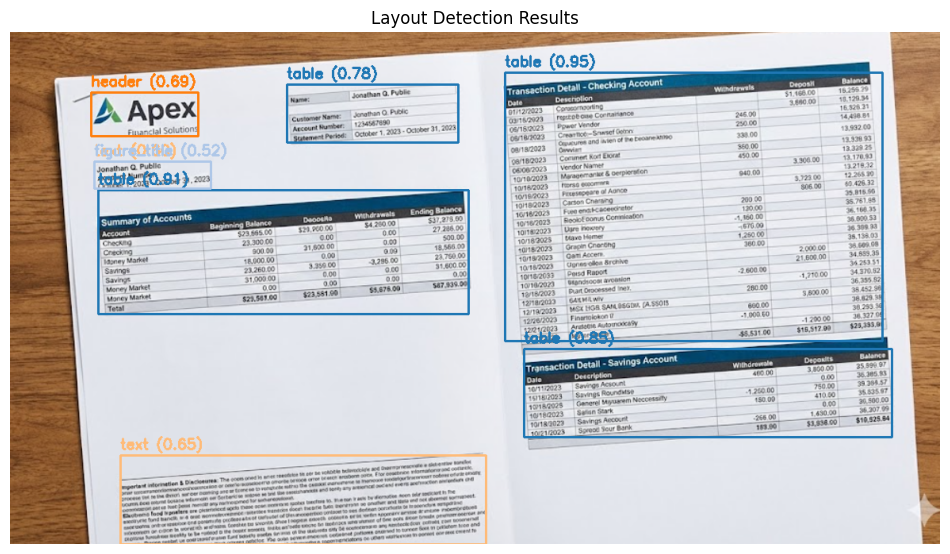

In [37]:
# Run visualization
result_image = visualize_layout("/content/drive/MyDrive/ade/bank_statement.png", min_confidence=0.5)

plt.figure(figsize=(12, 14))
plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("Layout Detection Results")
plt.show()


| Aspect | PaddleOCR | Tesseract |
|--------|-----------|----------|
| **Era** | Deep Learning | Traditional/Procedural |
| **Approach** | Neural networks | Hand-engineered rules |
| **Strength** | Real-world documents, irregular text | Clean printed text |
| **Output** | Text + bounding boxes + confidence scores | Text only |